<a href="https://colab.research.google.com/github/MarianoVizzo/Data_Wrangling_EDA/blob/main/Data_Wrangling_y_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **DATA WRANGLING Y EDA**

# **1. INTRODUCCIÓN**

El siguiente notebook se desarrollará una rutina de preprocesamiento sobre un conjunto de datos.

**1) En primer lugar**, se obtiene una breve descripción estadística y gráfica de cada una de las variables.

**2) En segundo lugar**, se aplicarán técnicas de limpieza, transformación y preparación de conjuntos de datos para su análisis.

**3) En tercer lugar**, se realizará un Análisis Exploratorio de Datos (EDA) luego de aplicar las técnicas de limpieza de datos.


# **2. PREPARACIÓN DE DATOS EN EL CONJUNTO DE DATOS**



In [19]:
# Importamos librerias
import pandas as pd
import time
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## **2.1. Carga de los datos**



Cargaremos los datos sobre los que trabajaremos:

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from google.colab import files

In [4]:
# Importamos el archivo
df = pd.read_csv('/content/drive/MyDrive/automobile_raw.csv')

In [5]:
# Cantidad de filas y columnas
df.shape

(240, 26)

### **2.1.1. Breve descripción estadística**

In [6]:
# Breve descripción del conjunto de datos
df.describe(include='all')

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
count,240.000000,199.000000,240,240,240,238,240,240,240,240.000000,...,240.000000,240,236.000000,236.000000,240.000000,238.000000,238.000000,240.000000,240.000000,236.000000
unique,NaN,NaN,22,2,2,2,5,3,2,NaN,...,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,toyota,gas,std,four,sedan,fwd,front,NaN,...,NaN,mpfi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,36,210,196,132,105,144,237,NaN,...,NaN,115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.787500,120.507538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.792083,...,124.229167,NaN,3.357119,3.238729,10.075917,102.357143,5166.033613,26.250000,30.525000,12314.292373
std,1.280956,35.264064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.186493,...,41.118891,NaN,0.324350,0.337232,4.065526,38.767218,503.771153,7.277236,7.280354,7828.397336
min,-2.000000,65.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.000000,...,61.000000,NaN,2.540000,2.000000,7.000000,47.000000,4089.000000,13.000000,13.000000,424.000000
25%,0.000000,94.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.500000,...,97.000000,NaN,3.050000,3.030000,8.500000,70.000000,4800.000000,21.000000,25.000000,7295.000000
50%,1.000000,113.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.000000,...,110.500000,NaN,3.310000,3.230000,9.000000,95.000000,5200.000000,25.500000,30.000000,9543.500000
75%,2.000000,149.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102.100000,...,141.000000,NaN,3.620000,3.402500,9.400000,116.000000,5500.000000,31.000000,34.000000,15656.250000


### **2.1.2. Tipos de datos de las variables**

In [7]:
# Tipos de datos de cada variable
df.dtypes

symboling              int64
normalized-losses    float64
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                 float64
stroke               float64
compression-ratio    float64
horsepower           float64
peak-rpm             float64
city-mpg               int64
highway-mpg            int64
price                float64
dtype: object

In [8]:
# Frecuencias para cada valor de la variable
df["engine-location"].value_counts()

front    237
rear       3
Name: engine-location, dtype: int64

In [9]:
# Frecuencias para cada valor de la variable
df["fuel-type"].value_counts()

gas       210
diesel     30
Name: fuel-type, dtype: int64

In [10]:
# Frecuencias para cada valor de la variable
df["aspiration"].value_counts()

std      196
turbo     44
Name: aspiration, dtype: int64

In [11]:
# Frecuencias para cada valor de la variable
df["num-of-doors"].value_counts()

four    132
two     106
Name: num-of-doors, dtype: int64

In [12]:
# Frecuencias para cada valor de la variable
df["drive-wheels"].value_counts()

fwd    144
rwd     85
4wd     11
Name: drive-wheels, dtype: int64

In [13]:
# Frecuencias para cada valor de la variable
df["body-style"].value_counts()

sedan          105
hatchback       86
wagon           26
convertible     12
hardtop         11
Name: body-style, dtype: int64

In [14]:
# Frecuencias para cada valor de la variable
df["symboling"].value_counts()

 0    76
 1    64
 2    36
 3    31
-1    26
-2     7
Name: symboling, dtype: int64

In [15]:
# Frecuencias para cada valor de la variable
df["engine-type"].value_counts()

ohc      173
ohcv      17
ohcf      17
dohc      15
l         13
rotor      4
dohcv      1
Name: engine-type, dtype: int64

In [16]:
# Frecuencias para cada valor de la variable
df["num-of-cylinders"].value_counts()

four      178
six        31
five       17
eight       6
two         4
three       3
twelve      1
Name: num-of-cylinders, dtype: int64

In [17]:
# Frecuencias para cada valor de la variable
df["fuel-system"].value_counts()

mpfi    115
2bbl     73
idi      24
spdi     11
1bbl     11
4bbl      3
mfi       2
spfi      1
Name: fuel-system, dtype: int64

In [18]:
# Breve descripción estadísitica
df.describe()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
count,240.000000,199.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,236.000000,236.000000,240.000000,238.000000,238.000000,240.000000,240.000000,236.000000
mean,0.787500,120.507538,98.792083,173.983750,65.671250,53.902500,2542.912500,124.229167,3.357119,3.238729,10.075917,102.357143,5166.033613,26.250000,30.525000,12314.292373
std,1.280956,35.264064,6.186493,12.867039,2.180737,2.555066,506.944614,41.118891,0.324350,0.337232,4.065526,38.767218,503.771153,7.277236,7.280354,7828.397336
min,-2.000000,65.000000,86.000000,141.100000,60.000000,47.800000,1488.000000,61.000000,2.540000,2.000000,7.000000,47.000000,4089.000000,13.000000,13.000000,424.000000
25%,0.000000,94.000000,94.500000,166.300000,64.000000,52.000000,2145.000000,97.000000,3.050000,3.030000,8.500000,70.000000,4800.000000,21.000000,25.000000,7295.000000
50%,1.000000,113.000000,97.000000,173.200000,65.400000,54.100000,2412.000000,110.500000,3.310000,3.230000,9.000000,95.000000,5200.000000,25.500000,30.000000,9543.500000
75%,2.000000,149.000000,102.100000,183.775000,66.500000,55.700000,2914.250000,141.000000,3.620000,3.402500,9.400000,116.000000,5500.000000,31.000000,34.000000,15656.250000
max,3.000000,256.000000,120.900000,208.100000,72.300000,62.000000,4066.000000,326.000000,4.000000,4.170000,25.000000,288.000000,7067.000000,51.000000,57.000000,45400.000000


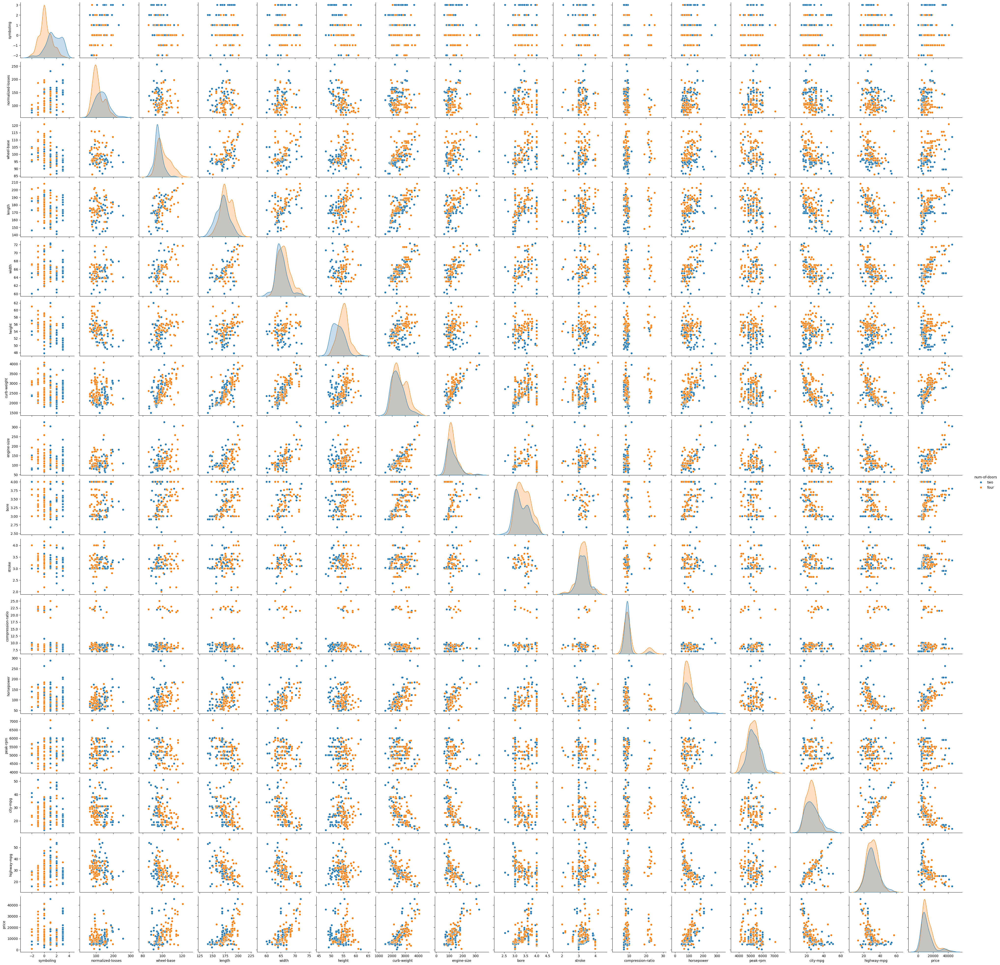

In [20]:
# Resumen gráfico de las diferentes variables
sns.pairplot(df, hue="num-of-doors")

**"pairplot"** es una herramienta poderosa para la visualización de datos que proporciona una visión general rápida y visual de las relaciones entre múltiples variables en un conjunto de datos.

A continuación, se utiliza la siguiente rutina para ir verificando los cambios que se realizan en el conjunto de datos. La misma muestra la cantidad de muestras, la cantidad de predictores y algunos valores interesantes en el caso que se indique alguna columna para mostrar. Este paso no es necesario en una rutina de preprocesamiento pero simplemente nos ayuda a verificar los cambios que se realizan.

In [22]:
# Definimos la función "print_stats"

from typing import List, Tuple

def print_stats(df: pd.DataFrame, detail_columns: List[str] = None):
  print(f"Muestras:", df.shape[0])
  print(f"Features:", df.shape[1])
  print(f"Faltantes:", df.isna().sum().sum())

  if detail_columns:
    print('Detalles:')
    for column in detail_columns:
      print(f"\tColumna: {column} ({df[column].dtype})")
      if df[column].dtype in ['O', 'Object', 'int64']:
        print(f"\t\tValores únicos: {len(df[column].unique())}")
        print(f"\t\tFaltantes: {df[column].isna().sum()}")
      if df[column].dtype in ['float32', 'float64']:
        print(f"\t\tMedia: {df[column].mean()}")

## **2.2. Data Wrangling**

### **2.2.1. Eliminar columnas que no son relevantes**

In [23]:
df.drop(columns=['symboling', 'normalized-losses'], inplace=True)

In [24]:
print_stats(df)

Muestras: 240
Features: 24
Faltantes: 18


### **2.2.2. Eliminar registros duplicados**

In [25]:
df.drop_duplicates(inplace=True)

In [26]:
print_stats(df)

Muestras: 240
Features: 24
Faltantes: 18


### **2.2.3. Eliminar valores faltantes en la columna a predecir**

In [27]:
df.dropna(axis='index', subset=['price'], inplace=True)

In [28]:
print_stats(df)

Muestras: 236
Features: 24
Faltantes: 14


### **2.2.4. Reagrupar variables categoricas**

In [29]:
mapping = {
  'two': 'cuatro-o-menos',
  'three': 'cuatro-o-menos',
  'four': 'cuatro-o-menos',
  'five': 'cinco-seis',
  'six': 'cinco-seis',
  'eight': 'ocho-doce',
  'twelve': 'ocho-doce',
}

In [30]:
df['num-of-cylinders'] = df['num-of-cylinders'].map(mapping)

In [31]:
print_stats(df, detail_columns=['num-of-cylinders'])

Muestras: 236
Features: 24
Faltantes: 14
Detalles:
	Columna: num-of-cylinders (object)
		Valores únicos: 3
		Faltantes: 0


### **2.2.5. Transformar la columna precio a una escala logarítmica**

In [32]:
import numpy as np

df['lnprice'] = np.log(df['price'])
df.drop(columns=['price'], inplace = True)

In [33]:
print_stats(df, detail_columns=['lnprice'])

Muestras: 236
Features: 24
Faltantes: 14
Detalles:
	Columna: lnprice (float64)
		Media: 9.249043799667156


### **2.2.6. Eliminar outliers**

In [34]:
df['engine-size'].clip(upper=280, inplace=True)

In [35]:
print_stats(df, detail_columns=['engine-size'])

Muestras: 236
Features: 24
Faltantes: 14
Detalles:
	Columna: engine-size (int64)
		Valores únicos: 67
		Faltantes: 0


## **2.3. Empaquetado de la rutina de preprocesamiento**

En la siguiente sección, se empaqueta las tranformaciones que se realizaron y se agrega la normalización, imputación de valores faltantes, y la codificación de variables.

### **2.3.1. Función de preprocesamiento**

In [36]:
def preprocess(X, y=None):
    import pandas as pd
    import numpy as np

    val = X.copy()

    if 'num-of-cylinders' in val.columns:
        mapping = {
          'two': 'cuatro-o-menos',
          'three': 'cuatro-o-menos',
          'four': 'cuatro-o-menos',
          'five': 'cinco-seis',
          'six': 'cinco-seis',
          'eight': 'ocho-doce',
          'twelve': 'ocho-doce',
        }

        val['num-of-cylinders'] = val['num-of-cylinders'].map(mapping)

    if 'engine-size' in val.columns:
        val['engine-size'].clip(upper=280, inplace=True)

    return val

### **2.3.2. Función de preparación de datos**

In [37]:
from typing import Tuple, List

import sklearn
from sklearn.pipeline import Pipeline, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer


# Funcion de preparación ajustada
def prepare(X: pd.DataFrame, transformations: sklearn.compose.ColumnTransformer = None, target: str = None) -> Tuple[pd.DataFrame, sklearn.compose.ColumnTransformer]:
    """
    Preprocesasa los diferentes valores de un conjunto de datos.

    Parameters
    ----------
    X: pd.DataFrame:
        Conjunto de datos a transformar
    transformations: sklearn.compose.ComlumnTransformer
        Transformaciones que se deben aplicar al conjunto de datos. Si no son indicadas, las mismas son aprendidas desde el conjunto de datos.
    target: str
        La variable objetivo del conjunto de datos. Si se indica, el preprocesamiento no descartará esta variable del conjunto de datos.

    Returns: Tuple[pd.DataFrame, sklearn.compose.ColumnTransformer]
        Una tupla donde la primer componente corresponde al conjunto de datos transformado y la segunda a las transformaciones que se aplicaron.
    """

    if target:
        target_values = X[target]

    features = {
        'discrete': [
            'make', 'fuel-type', 'aspiration', 'num-of-doors', 'body-style',
            'drive-wheels', 'engine-location', 'engine-type', 'num-of-cylinders',
            'fuel-system'],
        'continuous': [
            'wheel-base', 'length', 'width', 'height', 'curb-weight',
            'engine-size', 'bore', 'stroke', 'compression-ratio', 'horsepower',
            'peak-rpm', 'city-mpg', 'highway-mpg'
        ],
    }

    preprocess_transform = FunctionTransformer(func=preprocess, feature_names_out='one-to-one')

    num_pipe = Pipeline([
        ('preprocessing', preprocess_transform),
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    cat_pipe = Pipeline([
        ('preprocessing', preprocess_transform),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan))
    ])

    if transformations is None:
        transformations = ColumnTransformer(
            [
              #('preprocessing', preprocess_transform, features['continuous'] + features['discrete']),
              ('continuous_pipe', num_pipe, features['continuous']),
              ('discrete_pipe', cat_pipe, features['discrete']),
            ],
            remainder='drop')

        transformed = transformations.fit_transform(X)
    else:
        transformed = transformations.transform(X)

    all_features = [feat.split('__')[1] for feat in transformations.get_feature_names_out()]
    transformed_df = pd.DataFrame(transformed, columns=all_features,index = X.index )

    if target:
        transformed_df[target] = target_values

    return transformed_df, transformations

Utilizar esta runita para preparar los datos:

In [38]:
df = pd.read_csv('/content/drive/MyDrive/automobile_raw.csv')

In [39]:
transformed, transformations = prepare(df, target='price')

> Tip: Note como al indicar la propiedad `target='price'`, esta columna no es considerada un predictor sino que la variable a predecir y por lo tanto no es escalada ni alterada.

In [40]:
transformed

,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,...,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,engine-type,num-of-cylinders,fuel-system,price
0,-0.614243,-2.179385,-0.308452,1.214831,-0.298312,0.692172,-1.110038,-0.714959,-0.511682,-1.357277,...,1.0,1.0,1.0,2.0,1.0,0.0,5.0,2.0,6.0,4597.0
1,0.195659,-2.023624,0.151067,0.430436,1.545972,-0.097305,2.005130,-0.714959,2.199650,0.667121,...,0.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,1.0,4855.0
2,0.195659,-0.388136,0.151067,0.822634,-0.835982,0.080964,-1.110038,2.281725,-0.511682,-0.916062,...,0.0,0.0,0.0,1.0,2.0,0.0,3.0,0.0,4.0,6353.0
3,2.787343,0.702189,0.610586,0.430436,-0.061105,-1.166920,2.005130,-0.714959,-0.265197,-1.097739,...,0.0,0.0,0.0,2.0,1.0,0.0,3.0,1.0,3.0,13067.0
4,-1.262164,-0.154495,-1.227490,0.822634,0.065405,-0.250107,2.005130,-0.714959,-0.511682,-1.149646,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,13247.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,1.669679,1.153895,1.483672,0.626535,0.808653,0.437502,1.319793,-0.265456,-0.141955,0.303768,...,1.0,0.0,0.0,3.0,2.0,0.0,3.0,1.0,5.0,16845.0
236,1.669679,1.153895,1.437720,0.626535,1.000396,0.437502,1.319793,-0.265456,-0.339142,1.497644,...,1.0,1.0,0.0,3.0,2.0,0.0,3.0,1.0,5.0,19045.0
237,1.669679,1.153895,1.483672,0.626535,0.927257,1.252447,0.696759,-1.104528,-0.314494,0.822844,...,1.0,0.0,0.0,3.0,2.0,0.0,5.0,0.0,5.0,21485.0
238,1.669679,1.153895,1.483672,0.626535,1.332485,0.539370,-1.078887,0.483715,3.185589,0.096137,...,0.0,1.0,0.0,3.0,2.0,0.0,3.0,0.0,3.0,22470.0


La rutina de preprocesamiento solo transforma los predictores. Adicionalmente, se necesita realizar la transformación a la variable a predecir.

In [41]:
transformed['lnprice'] = np.log(df['price'])
transformed.drop(columns=['price'], inplace = True)

Guardamos el conjunto de datos:

In [42]:
transformed.to_csv('automobile_prepared.csv')

Guardamos las transformaciones asociadas:

In [43]:
import pickle
import cloudpickle

with open('transformations.pkl', 'wb') as f:
    cloudpickle.dump(transformations, f)

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# **3.ANÁLISIS EXPLORATORIO DE DATOS**

## **3.1.Carga y Visualización de Datos**

En este apartado se realizan las siguientes consultas para obtener un entendimiento de los datos.

- Carga tus datos en un DataFrame (puede ser en Python utilizando bibliotecas como Pandas).

- Visualiza las primeras filas de tus datos para tener una idea inicial de cómo están estructurados.

- Verifica el tipo de datos de cada columna para asegurarte de que sean adecuados (numéricos, categóricos).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

In [44]:
import pandas as pd
# Se importa el df preprocesado
df = pd.read_csv('/content/drive/MyDrive/automobile_prepared.csv')

In [45]:
# Cantidad de filas y columnas
df.shape

(240, 48)

In [46]:
# Información del df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240 entries, 0 to 239
Data columns (total 48 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           240 non-null    int64  
 1   wheel-base           240 non-null    float64
 2   length               240 non-null    float64
 3   width                240 non-null    float64
 4   height               240 non-null    float64
 5   curb-weight          240 non-null    int64  
 6   engine-size          240 non-null    int64  
 7   bore                 236 non-null    float64
 8   stroke               236 non-null    float64
 9   compression-ratio    240 non-null    float64
 10  horsepower           238 non-null    float64
 11  peak-rpm             238 non-null    float64
 12  city-mpg             240 non-null    int64  
 13  highway-mpg          240 non-null    int64  
 14  make                 240 non-null    object 
 15  fuel-type            240 non-null    obj

- Mediante info() se obtiene el nombre de cada columna del dataframe, la cantidad de valores no nulos en cada columna y el tipo de datos de cada columna (por ejemplo, se visualiza que la variable "make" del tipo object se convirtió en float64 mediante el preprocesamiento de datos.

- La variable "lnprice" tiene 4 valores nulos luego del reprocesamiento.

- Esto es necesario verificarlo ya que existen modelos de aprendizaje automático que no aceptan datos no numéricos o nulos.



Tabla en la cual puede visualisarse el significado de cada variable:

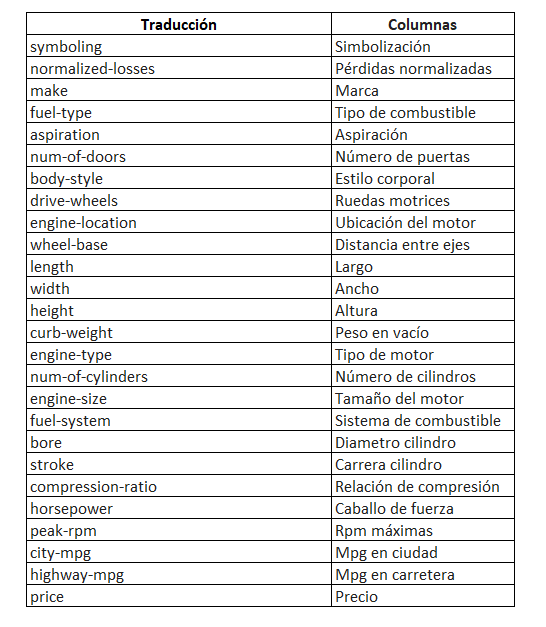

## **3.2. Resumen Estadístico**

Se importa el dataframe original para lograr un mejor entendimiento de los valores estadísticos relacionados al contexto del negocio.

In [47]:
df = pd.read_csv('/content/drive/MyDrive/automobile_raw.csv')

In [48]:
# Descripción del df
df.describe(include='all')

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
count,240.000000,199.000000,240,240,240,238,240,240,240,240.000000,...,240.000000,240,236.000000,236.000000,240.000000,238.000000,238.000000,240.000000,240.000000,236.000000
unique,NaN,NaN,22,2,2,2,5,3,2,NaN,...,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,toyota,gas,std,four,sedan,fwd,front,NaN,...,NaN,mpfi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,36,210,196,132,105,144,237,NaN,...,NaN,115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.787500,120.507538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.792083,...,124.229167,NaN,3.357119,3.238729,10.075917,102.357143,5166.033613,26.250000,30.525000,12314.292373
std,1.280956,35.264064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.186493,...,41.118891,NaN,0.324350,0.337232,4.065526,38.767218,503.771153,7.277236,7.280354,7828.397336
min,-2.000000,65.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.000000,...,61.000000,NaN,2.540000,2.000000,7.000000,47.000000,4089.000000,13.000000,13.000000,424.000000
25%,0.000000,94.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.500000,...,97.000000,NaN,3.050000,3.030000,8.500000,70.000000,4800.000000,21.000000,25.000000,7295.000000
50%,1.000000,113.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.000000,...,110.500000,NaN,3.310000,3.230000,9.000000,95.000000,5200.000000,25.500000,30.000000,9543.500000
75%,2.000000,149.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102.100000,...,141.000000,NaN,3.620000,3.402500,9.400000,116.000000,5500.000000,31.000000,34.000000,15656.250000


Como breve descripción del dataframe se puede mencionar lo siguiente:

- **Price:** El valor promedio es de 12314,29, el valor máximo es de 45400 y el valor mínimo es de 424. La disparidad entre los precios hace presumir que existen valores outliers.

- **Make:** Existen 22 marcas, el top de marca corresponde a Toyota de un total de 36 registros.

- **Fuel-type**: Existen 2 tipos de fuel-type, el top corresponde a gas de un total de 210 registros.

- **Aspiration:** Existen 2 tipos, el top corresponde a std de un total de 196 registros.

- **Num of doors:** Existen 2 tipos, el top es de 4 puertas de un total de 132 registros.

- **Body style:** Existen 5 tipos, el top es sedan de un total de 105 registros.

- **Drive-wheels:** Existen 3 tipos, el top es fwd de un total de 144 registros.

- **Engine-location:** Existen 2 tipos, el top es front de un total de 237 registros.

- **Engine-Type:** Existen 7 tipos, el top es ohc de un total de 173 registros.

- **Num-of-cylinders:** Existen 7 tipos, el top es four de un total de 178 registros.

- **Fuel-system:** Existen 8 tipos, el top es mpfi de un total de 115 registros.

- **El resto de las variables**: Serán analizadas a lo largo del presente trabajo.



## **3.3. Análisis de Valores Faltantes y Duplicados**

Se Identifican columnas con valores faltantes y se decide cómo manejarlos (imputación, eliminación, etc.).

In [49]:
# Se importa el df preprocesado
df = pd.read_csv('/content/drive/MyDrive/automobile_prepared.csv')

In [50]:
# Verificar si existen valores duplicados en el df
df.duplicated().sum()

0

No hay valores duplicados

In [51]:
# Verificar si existen valores nulos en el df
df.isna().sum().sort_values(ascending=False)

lnprice                4
bore                   4
stroke                 4
horsepower             2
peak-rpm               2
num-of-doors           2
make.1                 0
engine-size.1          0
bore.1                 0
stroke.1               0
compression-ratio.1    0
horsepower.1           0
peak-rpm.1             0
city-mpg.1             0
highway-mpg.1          0
aspiration.1           0
fuel-type.1            0
height.1               0
num-of-doors.1         0
body-style.1           0
drive-wheels.1         0
engine-location.1      0
engine-type.1          0
num-of-cylinders.1     0
fuel-system.1          0
curb-weight.1          0
Unnamed: 0             0
width.1                0
make                   0
length                 0
width                  0
height                 0
curb-weight            0
engine-size            0
compression-ratio      0
city-mpg               0
highway-mpg            0
fuel-type              0
length.1               0
aspiration             0


In [52]:
# Columnas con porcentaje de datos nulos
pd.set_option('display.max_rows', None)  # or 1000
serie=(df.isnull().sum()/df.shape[0])*100
serie=serie.sort_values(ascending=False)
serie= serie[serie>0]
serie

lnprice         1.666667
bore            1.666667
stroke          1.666667
horsepower      0.833333
peak-rpm        0.833333
num-of-doors    0.833333
dtype: float64

El dataframe tiene valores faltantes en las siguuientes variables:

- lnprice: 4 registros.
- bore: 4 registros.                  
- stroke: 4 registros.                 
- horsepower: 2 registros.             
- peak-rpm: 2 registros.               
- num-of-doors: 2 registros.       

El análisis de valores faltantes es necesario verificarlo ya que existen modelos de aprendizaje automático que no aceptan datos no numéricos o nulos.

Especificamente en el presente trabajo, se optará por eliminar aquellos valores faltantes.


## **3.4. Análisis de Correlaciones**

 - Calcula la matriz de correlación para comprender las relaciones entre variables.

 - Visualiza la matriz de correlación utilizando un mapa de calor.

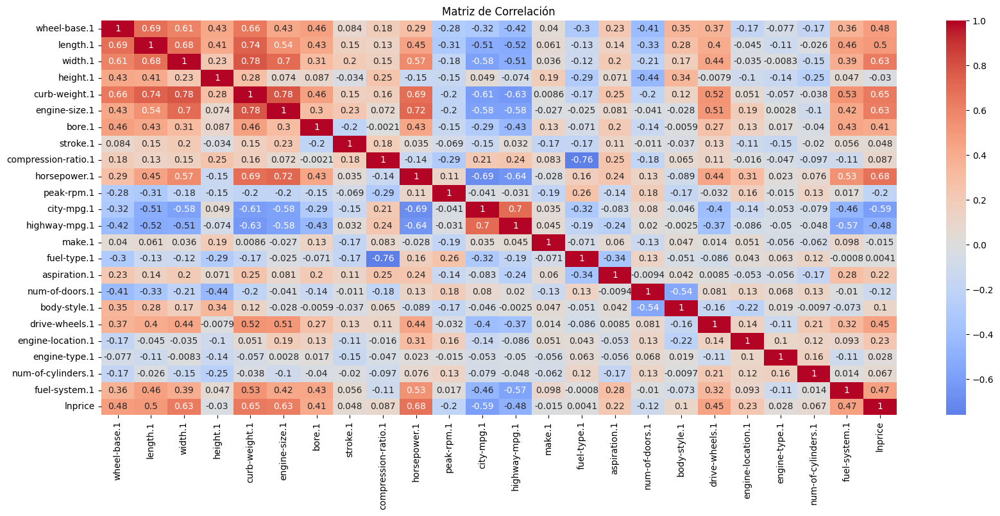

In [53]:
# Matriz de correlación

# Se filtran las variables necesarias para graficar la matriz de correlación
cols = ['wheel-base.1','length.1','width.1','height.1','curb-weight.1','engine-size.1',
'bore.1','stroke.1','compression-ratio.1','horsepower.1','peak-rpm.1','city-mpg.1','highway-mpg.1',
'make.1','fuel-type.1','aspiration.1','num-of-doors.1','body-style.1','drive-wheels.1','engine-location.1','engine-type.1','num-of-cylinders.1','fuel-system.1','lnprice']
df2 = df[cols]

correlation_matrix = df2.corr()
plt.figure(figsize=(20, 8))  # Ajusta el tamaño del gráfico si es necesario
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Matriz de Correlación")
plt.show()

Observando la matriz de correlación se interpreta lo siguiente:

- **Correlaciones Positivas:**

   **1) Lnprice:** Se correlaciona fuertemente con las variables "horsepower", "curb-weight", "engine-size", "width". En el gráfico siguiente se pueden observar las correlaciones positivas y negativas.

   **2) Curb-weight:** Se correlaciona fuertemente con las variables "engine-size", "width", "lenght". Esto puede significar variables redundantes por lo que en el presente trabajo esto se analizará en el punto 3.INGENIERÍA DE PREDICTORES, donde se explica las diferentes estrategias de selección de predictores que sean los mas adecuadas al contexto de negocio que se está analizando, que en este caso es la predicción del precio de venta de automóviles.

- **Correlaciones Negativas:**

  **1) Lnprice:** Se correlaciona fuertemente con "city-mpg" y highway-mpg".

  **2)** Las variables "fuel-type" y "compression-ratio" se correlacionan fuertemente.

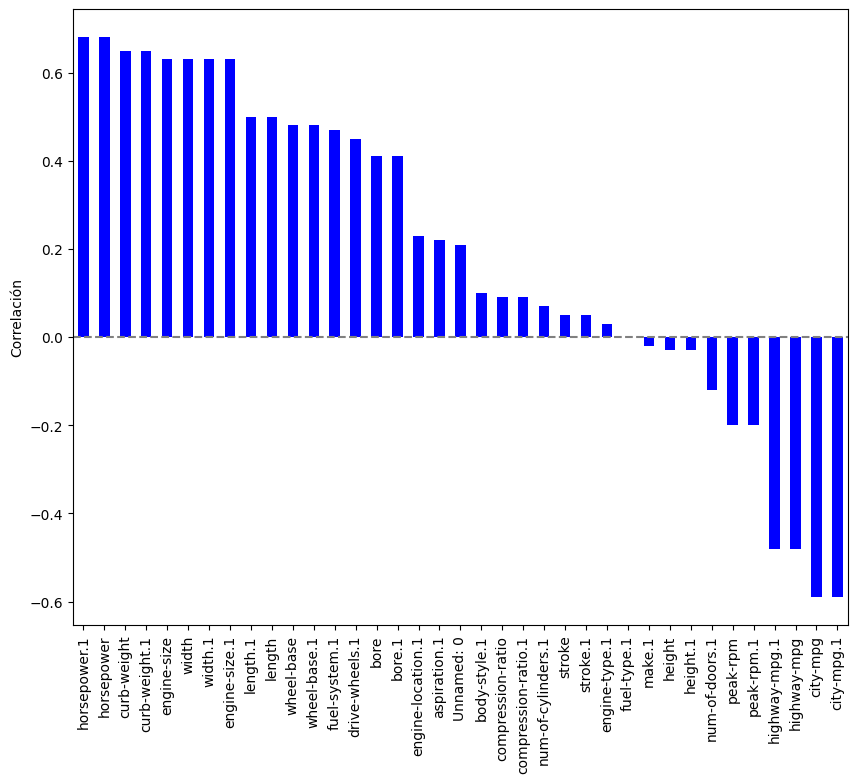

In [54]:
# Gráfico de correlación respecto a "Price" (Variable a predecir)
ax = round(df.corr()['lnprice'].sort_values(ascending = False)[1:] ,2 ).plot(kind = 'bar',color='blue' , figsize = (10,8))
ax.set_ylabel('Correlación')
ax.axhline(0,color='gray',linestyle='--')
plt.show()

A continuación, se verifica si las distribuciones del df original y del df procesado se modificaron.

## **3.5. Visualización de Distribuciones**

- Se grafican histogramas para entender la distribución de las variables numéricas.

- Se utilizan gráficos de densidad o box plots para visualizar aún más la distribución y detectar valores atípicos.

Se opta por utilizar un Pairplot ya que es una herramienta gráfica que  permite visualizar las relaciones entre múltiples variables numéricas en un conjunto de datos. Los pair plots son especialmente útiles en el análisis exploratorio de datos para identificar patrones y relaciones entre variables antes de construir un modelo de aprendizaje automático.

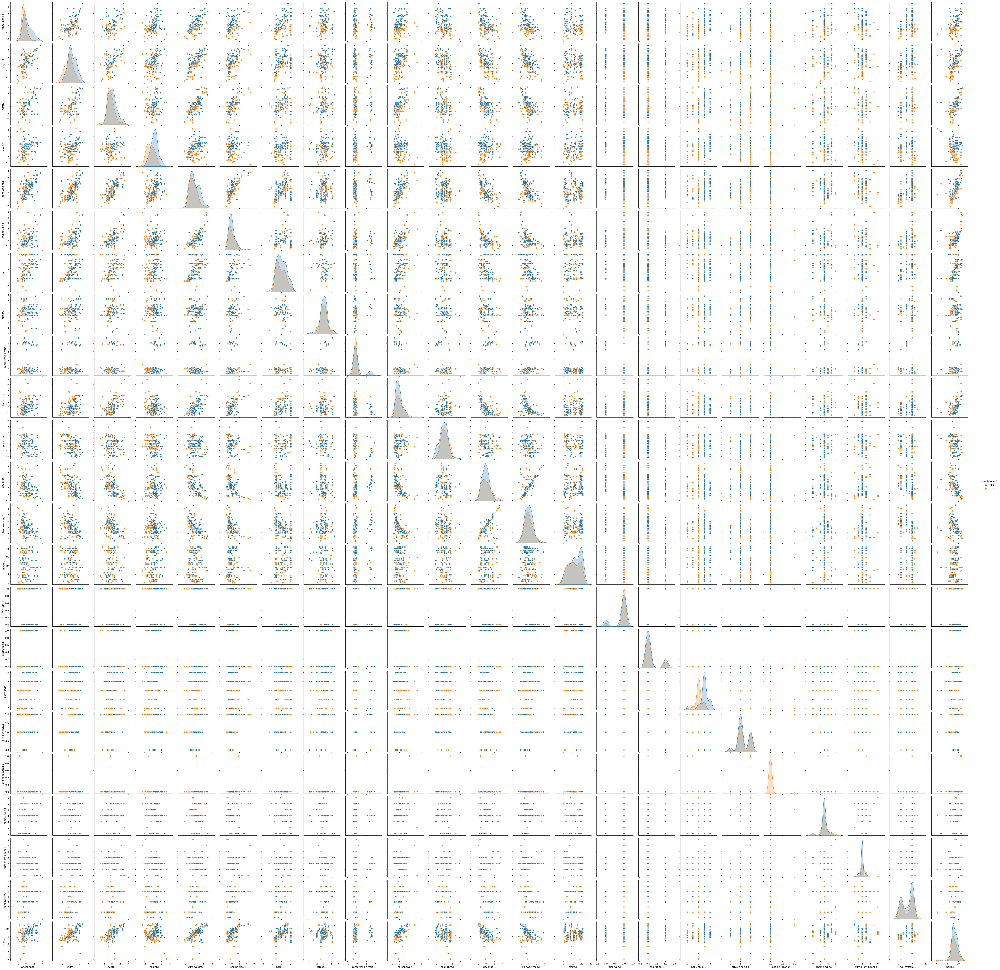

In [ ]:
# Resumen mediante un pairplot del df procesado
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df2, hue="num-of-doors.1")

A continuación se realizará un análisis univariado y bivariado comparando el Dataframe original y el Dataframe preprocesado con el objetivo de verificar si en la rutina de preprocesamiento se modificaron las distribuciones de las variables.

### **3.5.1. Análisis Univariado**

#### **Variables numéricas**

- Se hace un análisis univariado de cada variable verificando ambos Dataframe.
- Se verifica que las distribuciones de las variables numéricas no fueron modificadas con el preprocesamiento a excepción de "price", ya que se utilizó una función logarítimica en la rutina de preprocesamiento.

In [ ]:
# Se importa el df preprocesado
df = pd.read_csv('/content/drive/MyDrive/automobile_prepared.csv')

In [ ]:
# Se filtran las variables y se crea un df1 para aplicar matriz de correlación
cols = ['wheel-base.1','length.1','width.1','height.1','curb-weight.1','engine-size.1',
'bore.1','stroke.1','compression-ratio.1','horsepower.1','peak-rpm.1','city-mpg.1','highway-mpg.1',
'make.1','fuel-type.1','aspiration.1','num-of-doors.1','body-style.1','drive-wheels.1','engine-location.1','engine-type.1','num-of-cylinders.1','fuel-system.1','lnprice']
df2 = df[cols]

In [ ]:
# Se importa el df original
df = pd.read_csv('/content/drive/MyDrive/automobile_raw.csv')

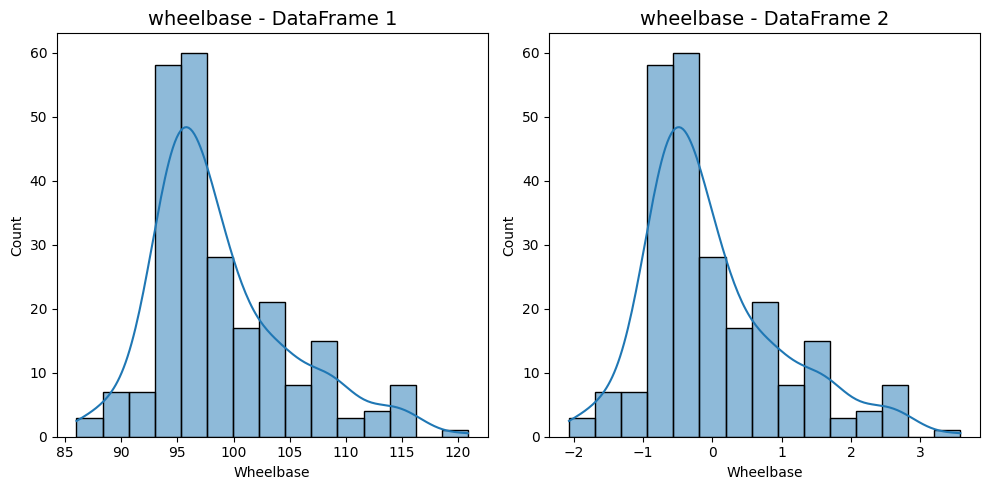

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

# Histograma para DataFrame 1
plt.subplot(1, 2, 1)
sns.histplot(data=df, x="wheel-base", kde=True)
plt.title("wheelbase - DataFrame 1", fontsize=14)
plt.xlabel("Wheelbase")
plt.ylabel("Count")

# Histograma para DataFrame 2
plt.subplot(1, 2, 2)
sns.histplot(data=df2, x="wheel-base.1", kde=True)
plt.title("wheelbase - DataFrame 2", fontsize=14)
plt.xlabel("Wheelbase")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

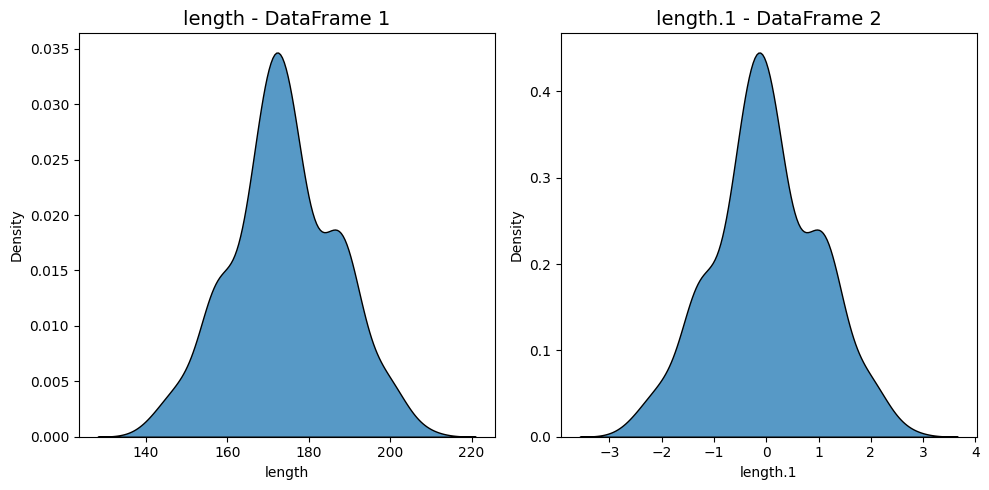

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="length", hue=None, multiple="stack")
plt.title("length - DataFrame 1", fontsize=14)
plt.xlabel("length")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="length.1", hue=None, multiple="stack")
plt.title("length.1 - DataFrame 2", fontsize=14)
plt.xlabel("length.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

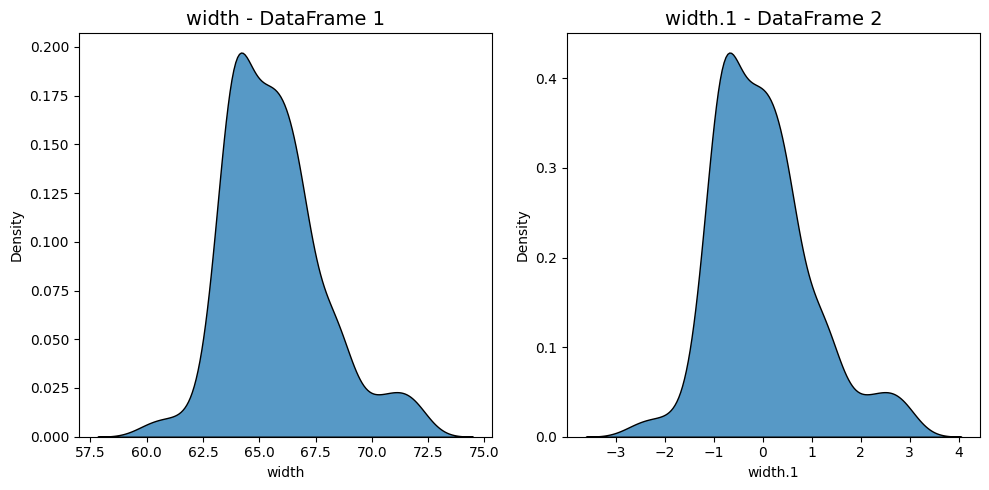

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="width", hue=None, multiple="stack")
plt.title("width - DataFrame 1", fontsize=14)
plt.xlabel("width")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="width.1", hue=None, multiple="stack")
plt.title("width.1 - DataFrame 2", fontsize=14)
plt.xlabel("width.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

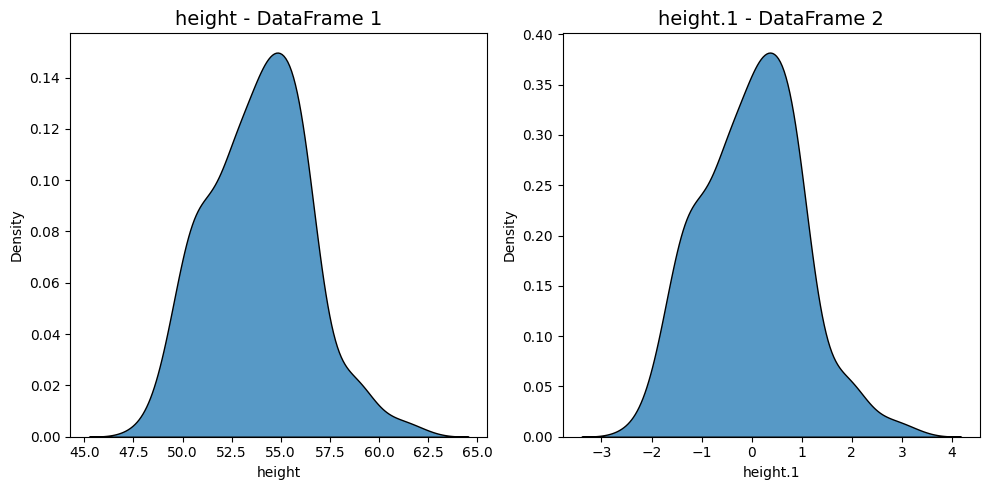

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="height", hue=None, multiple="stack")
plt.title("height - DataFrame 1", fontsize=14)
plt.xlabel("height")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="height.1", hue=None, multiple="stack")
plt.title("height.1 - DataFrame 2", fontsize=14)
plt.xlabel("height.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

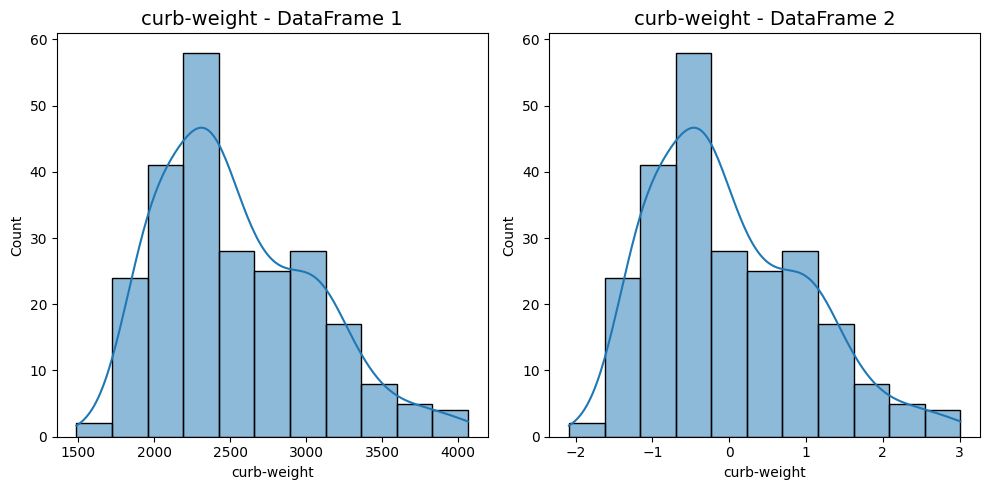

In [ ]:
plt.figure(figsize=(10, 5))

# Histograma para dataframe 1
plt.subplot(1, 2, 1)
sns.histplot(df["curb-weight"], kde=True)
plt.title("curb-weight - DataFrame 1", fontsize=14)
plt.xlabel("curb-weight")
plt.ylabel("Count")

# Histograma para dataframe 2
plt.subplot(1, 2, 2)
sns.histplot(df2["curb-weight.1"], kde=True)
plt.title("curb-weight - DataFrame 2", fontsize=14)
plt.xlabel("curb-weight")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

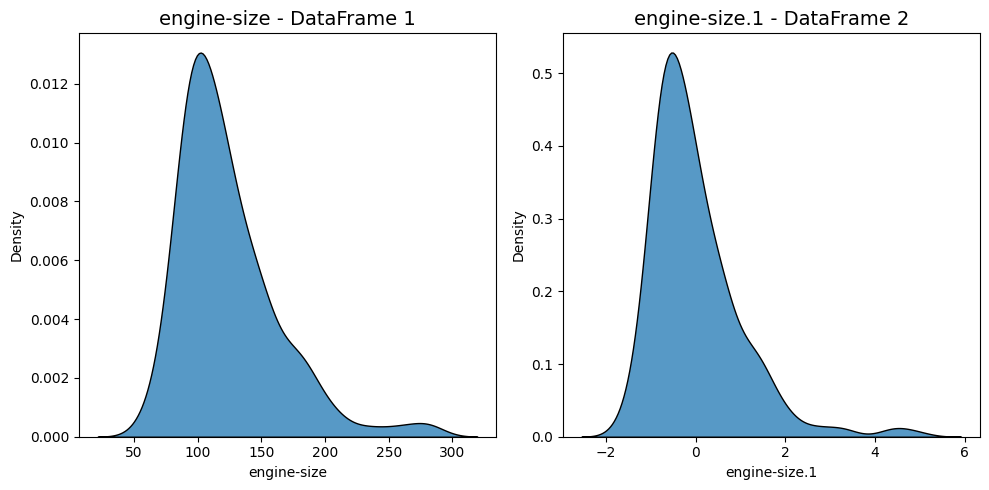

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="engine-size", hue=None, multiple="stack")
plt.title("engine-size - DataFrame 1", fontsize=14)
plt.xlabel("engine-size")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="engine-size.1", hue=None, multiple="stack")
plt.title("engine-size.1 - DataFrame 2", fontsize=14)
plt.xlabel("engine-size.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

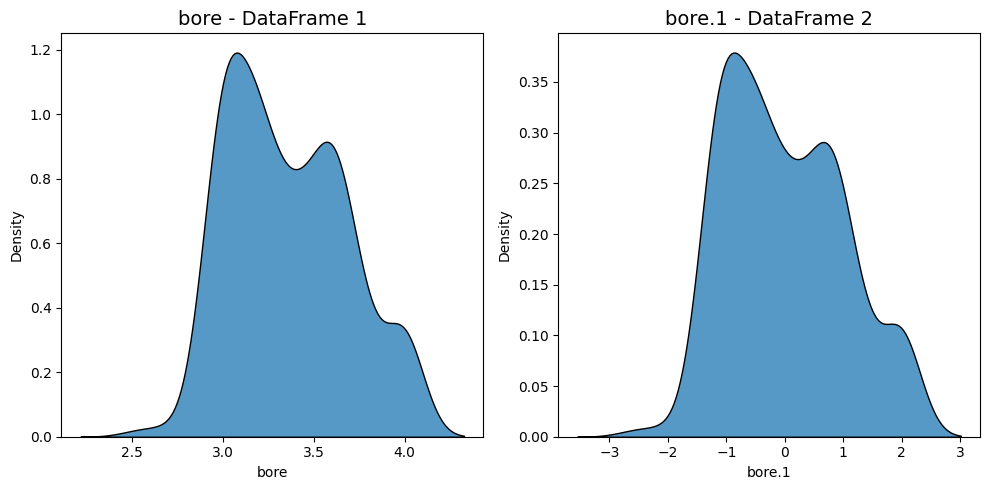

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="bore", hue=None, multiple="stack")
plt.title("bore - DataFrame 1", fontsize=14)
plt.xlabel("bore")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="bore.1", hue=None, multiple="stack")
plt.title("bore.1 - DataFrame 2", fontsize=14)
plt.xlabel("bore.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

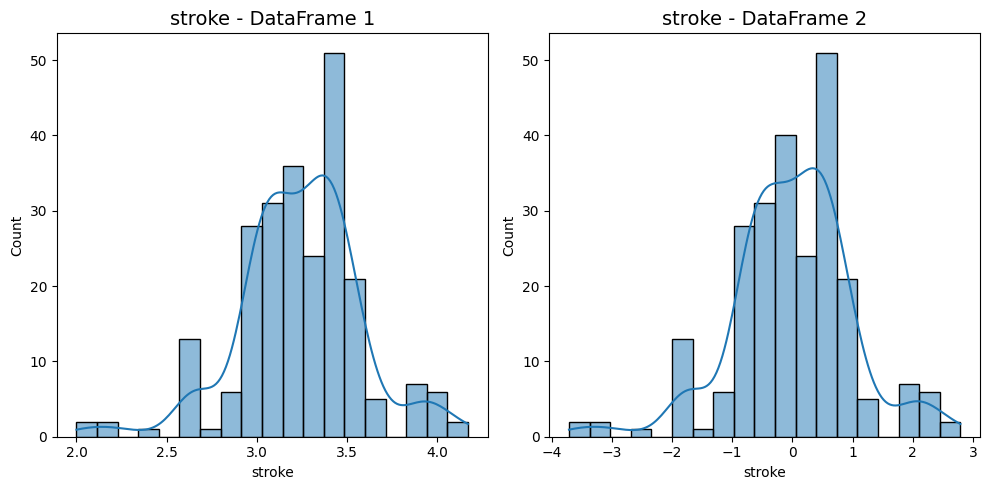

In [ ]:
plt.figure(figsize=(10, 5))

# Histograma para dataframe 1
plt.subplot(1, 2, 1)
sns.histplot(df["stroke"], kde=True)
plt.title("stroke - DataFrame 1", fontsize=14)
plt.xlabel("stroke")
plt.ylabel("Count")

# Histograma para dataframe 2
plt.subplot(1, 2, 2)
sns.histplot(df2["stroke.1"], kde=True)
plt.title("stroke - DataFrame 2", fontsize=14)
plt.xlabel("stroke")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

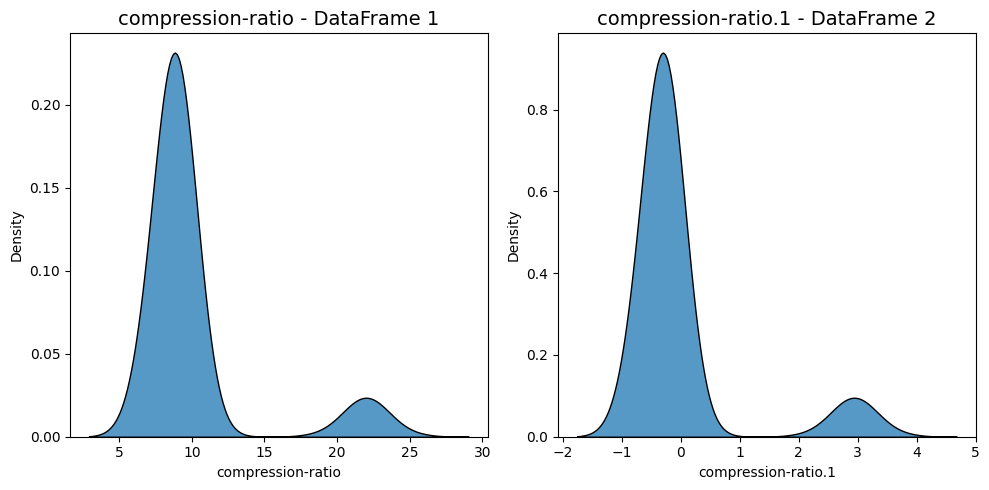

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="compression-ratio", hue=None, multiple="stack")
plt.title("compression-ratio - DataFrame 1", fontsize=14)
plt.xlabel("compression-ratio")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="compression-ratio.1", hue=None, multiple="stack")
plt.title("compression-ratio.1 - DataFrame 2", fontsize=14)
plt.xlabel("compression-ratio.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

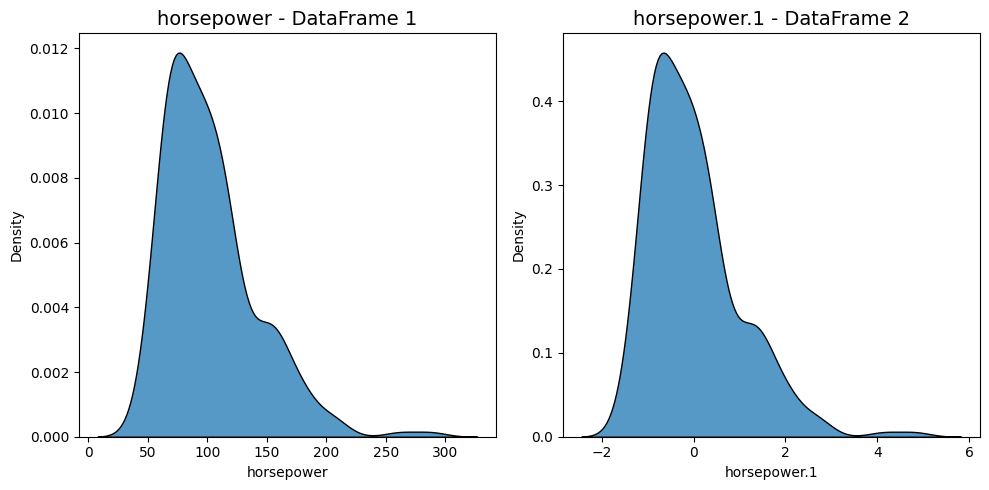

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="horsepower", hue=None, multiple="stack")
plt.title("horsepower - DataFrame 1", fontsize=14)
plt.xlabel("horsepower")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="horsepower.1", hue=None, multiple="stack")
plt.title("horsepower.1 - DataFrame 2", fontsize=14)
plt.xlabel("horsepower.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

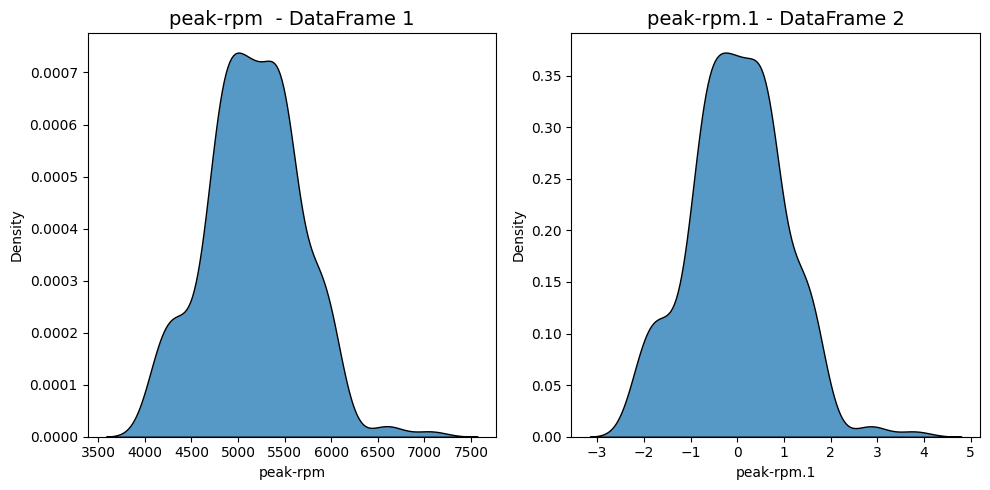

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="peak-rpm", hue=None, multiple="stack")
plt.title("peak-rpm  - DataFrame 1", fontsize=14)
plt.xlabel("peak-rpm")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="peak-rpm.1", hue=None, multiple="stack")
plt.title("peak-rpm.1 - DataFrame 2", fontsize=14)
plt.xlabel("peak-rpm.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

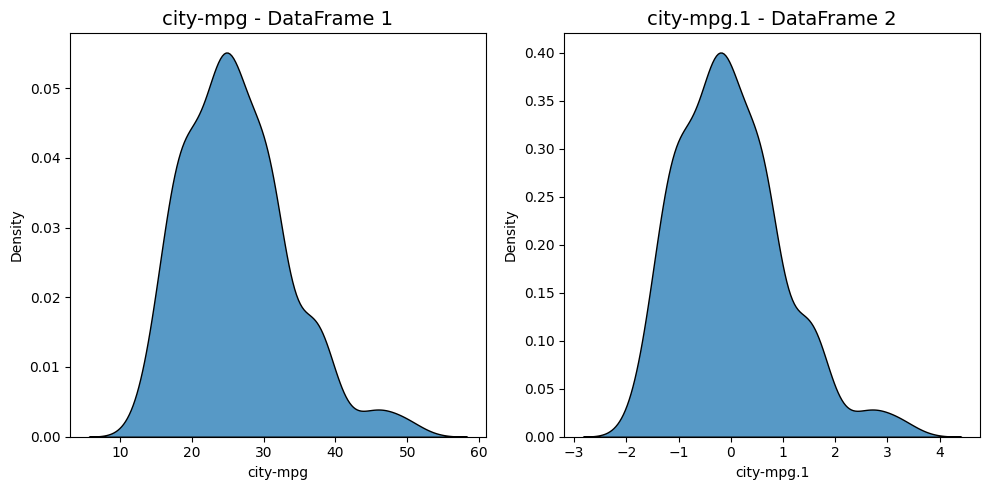

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe 1
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="city-mpg", hue=None, multiple="stack")
plt.title("city-mpg - DataFrame 1", fontsize=14)
plt.xlabel("city-mpg")
plt.ylabel("Density")

# Gráfico KDE para dataframe 2
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="city-mpg.1", hue=None, multiple="stack")
plt.title("city-mpg.1 - DataFrame 2", fontsize=14)
plt.xlabel("city-mpg.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()


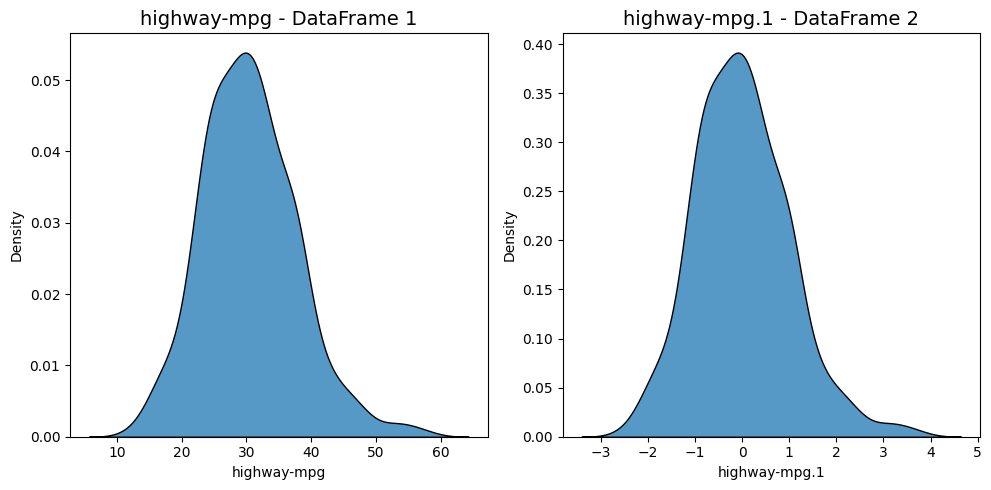

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="highway-mpg", hue=None, multiple="stack")
plt.title("highway-mpg - DataFrame 1", fontsize=14)
plt.xlabel("highway-mpg")
plt.ylabel("Density")

# Gráfico KDE para dataframe1
plt.subplot(1, 2, 2)
sns.kdeplot(df1, x="highway-mpg.1", hue=None, multiple="stack")
plt.title("highway-mpg.1 - DataFrame 2", fontsize=14)
plt.xlabel("highway-mpg.1")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

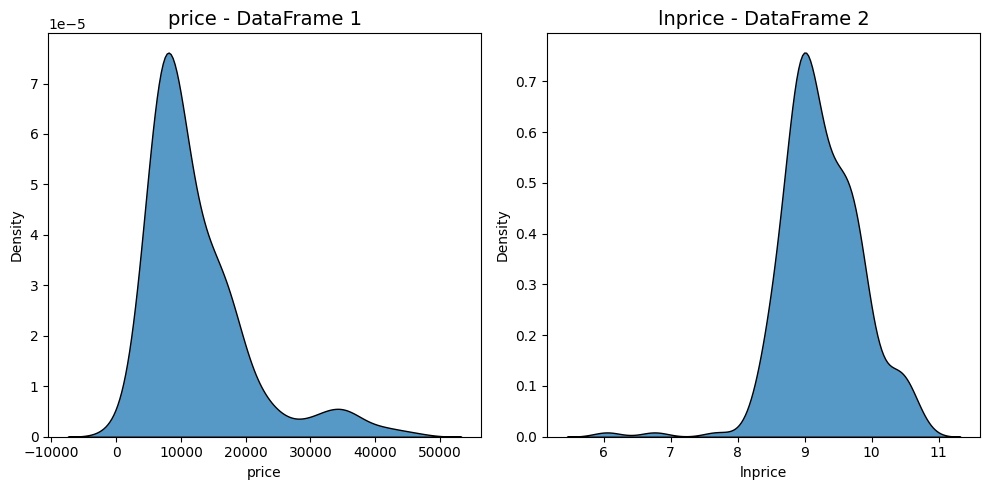

In [ ]:
plt.figure(figsize=(10, 5))

# Gráfico KDE para dataframe
plt.subplot(1, 2, 1)
sns.kdeplot(df, x="price", hue=None, multiple="stack")
plt.title("price - DataFrame 1", fontsize=14)
plt.xlabel("price")
plt.ylabel("Density")


# Gráfico KDE para dataframe1
plt.subplot(1, 2, 2)
sns.kdeplot(df2, x="lnprice", hue=None, multiple="stack")
plt.title("lnprice - DataFrame 2", fontsize=14)
plt.xlabel("lnprice")
plt.ylabel("Density")

plt.tight_layout()
plt.show()

#### **Variables categóricas**

 - A continuación se grafican histogramas de las variables categóricas del Dataframe. Se visualiza cada gráfico con las respectivas frecuencias para cada valor de las variables.

 - Se verifica que las distribuciones de las variables categóricas no fueron modificadas en el preprocesamiento

In [ ]:
numerical_cols = []
categorical_cols = []

def get_numerical_and_categorical_columns(df):
    for column in df.columns:
        if pd.api.types.is_numeric_dtype(df[column]):
            numerical_cols.append(column)
        else:
            categorical_cols.append(column)

In [ ]:
get_numerical_and_categorical_columns(df)

In [ ]:
# Variables categóricas
categorical_cols

['make',
 'fuel-type',
 'aspiration',
 'num-of-doors',
 'body-style',
 'drive-wheels',
 'engine-location',
 'engine-type',
 'num-of-cylinders',
 'fuel-system']

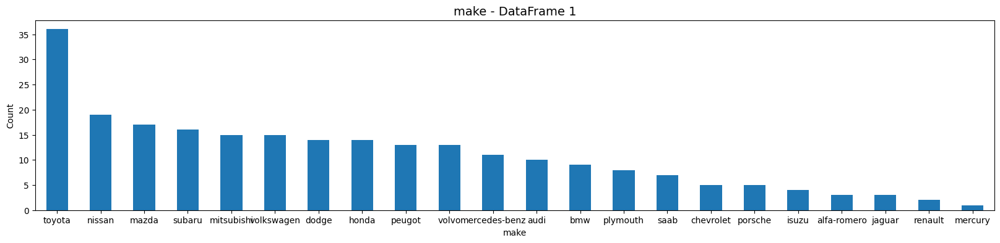

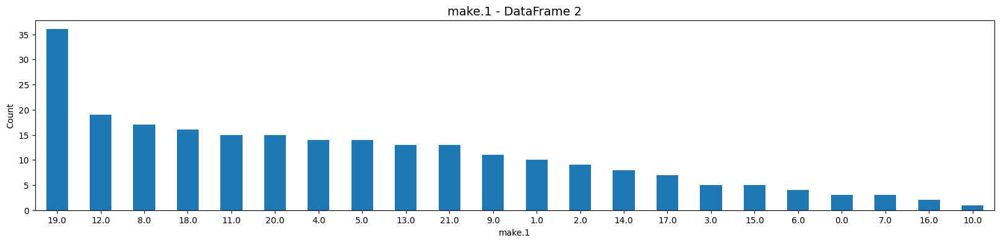

In [ ]:
# Gráfico para df1
plt.figure(figsize=(20, 4))
df["make"].value_counts().plot(kind="bar", figsize=(20, 4), rot=0)
plt.title("make - DataFrame 1", fontsize=14)
plt.xlabel("make")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(20, 4))
df2["make.1"].value_counts().plot(kind="bar", figsize=(20, 4), rot=0)
plt.title("make.1 - DataFrame 2", fontsize=14)
plt.xlabel("make.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["make"].value_counts()

toyota           36
nissan           19
mazda            17
subaru           16
mitsubishi       15
volkswagen       15
dodge            14
honda            14
peugot           13
volvo            13
mercedes-benz    11
audi             10
bmw               9
plymouth          8
saab              7
chevrolet         5
porsche           5
isuzu             4
alfa-romero       3
jaguar            3
renault           2
mercury           1
Name: make, dtype: int64

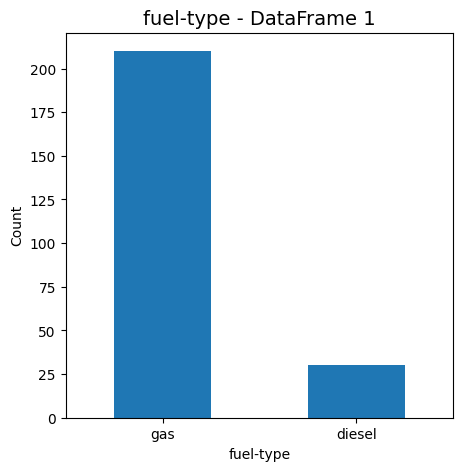

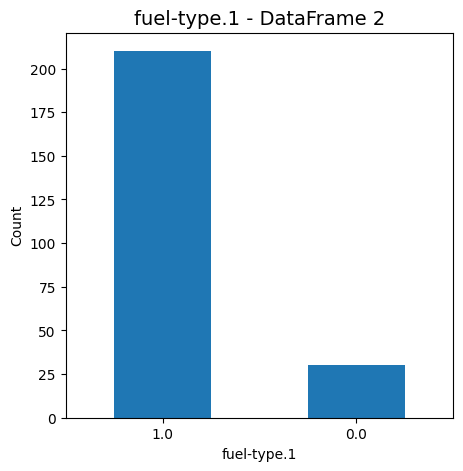

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["fuel-type"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("fuel-type - DataFrame 1", fontsize=14)
plt.xlabel("fuel-type")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["fuel-type.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("fuel-type.1 - DataFrame 2", fontsize=14)
plt.xlabel("fuel-type.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["fuel-type"].value_counts()

gas       210
diesel     30
Name: fuel-type, dtype: int64

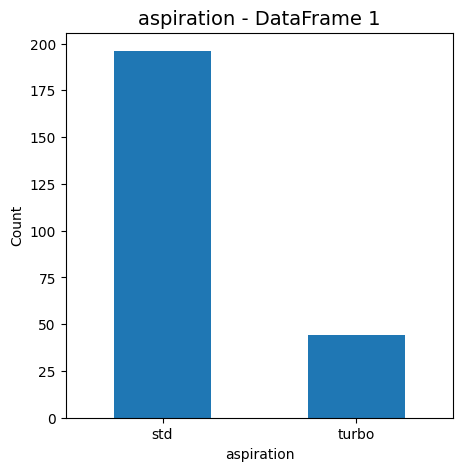

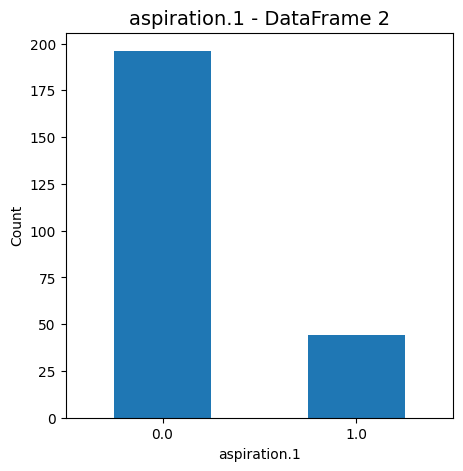

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["aspiration"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("aspiration - DataFrame 1", fontsize=14)
plt.xlabel("aspiration")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["aspiration.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("aspiration.1 - DataFrame 2", fontsize=14)
plt.xlabel("aspiration.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["aspiration"].value_counts()

std      196
turbo     44
Name: aspiration, dtype: int64

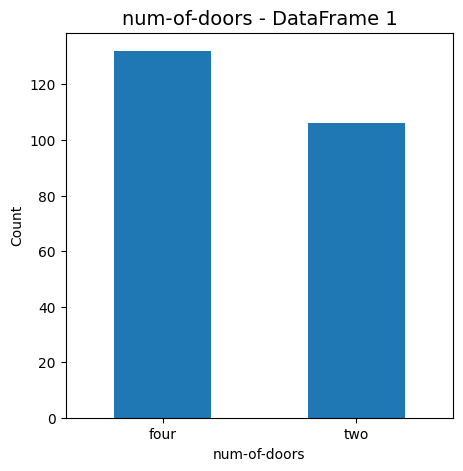

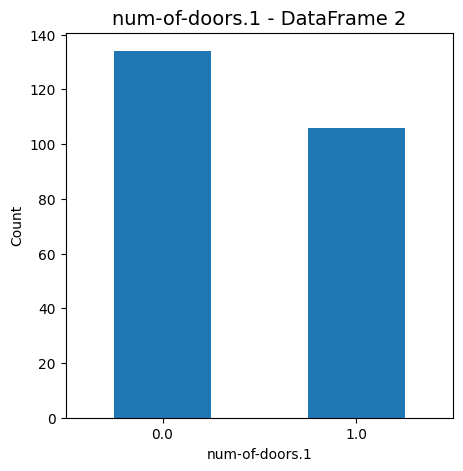

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["num-of-doors"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("num-of-doors - DataFrame 1", fontsize=14)
plt.xlabel("num-of-doors")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["num-of-doors.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("num-of-doors.1 - DataFrame 2", fontsize=14)
plt.xlabel("num-of-doors.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["num-of-doors"].value_counts()

four    132
two     106
Name: num-of-doors, dtype: int64

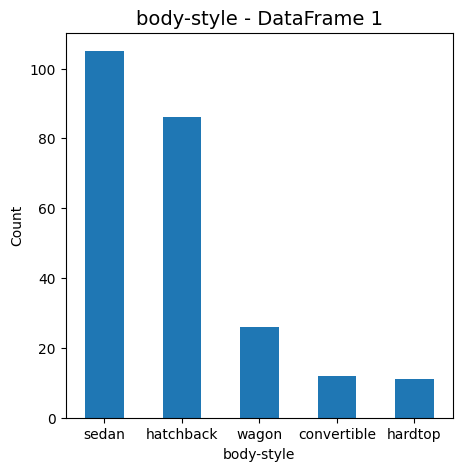

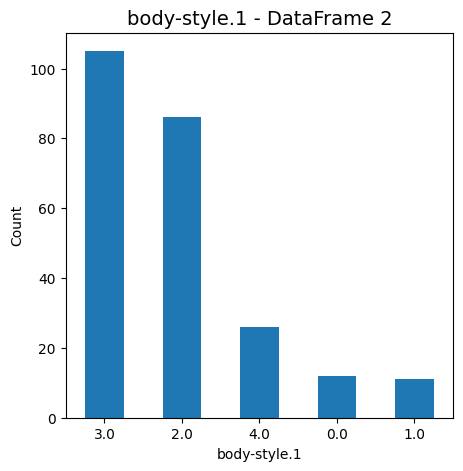

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["body-style"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("body-style - DataFrame 1", fontsize=14)
plt.xlabel("body-style")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["body-style.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("body-style.1 - DataFrame 2", fontsize=14)
plt.xlabel("body-style.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["body-style"].value_counts()

3.0    105
2.0     86
4.0     26
0.0     12
1.0     11
Name: body-style.1, dtype: int64

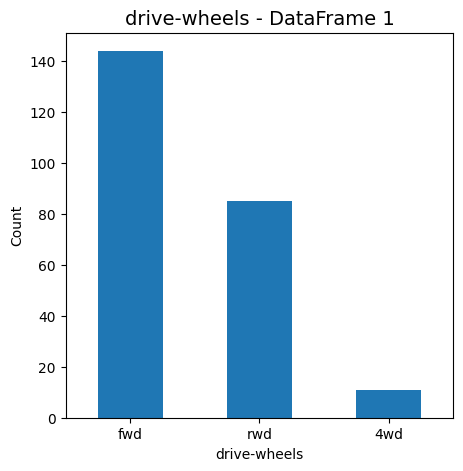

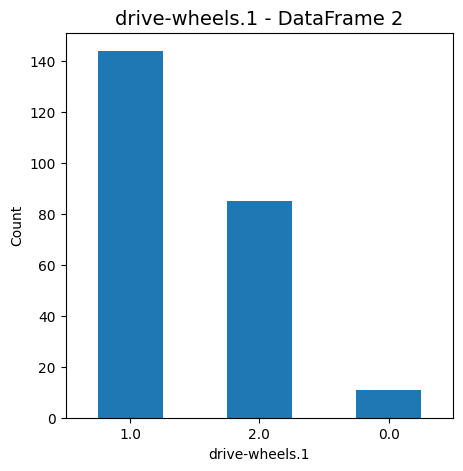

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["drive-wheels"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("drive-wheels - DataFrame 1", fontsize=14)
plt.xlabel("drive-wheels")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["drive-wheels.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("drive-wheels.1 - DataFrame 2", fontsize=14)
plt.xlabel("drive-wheels.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["drive-wheels"].value_counts()

fwd    144
rwd     85
4wd     11
Name: drive-wheels, dtype: int64

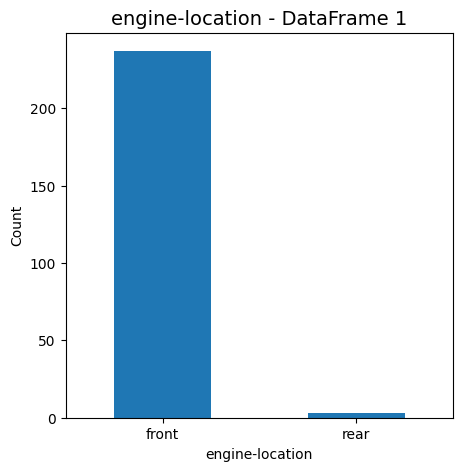

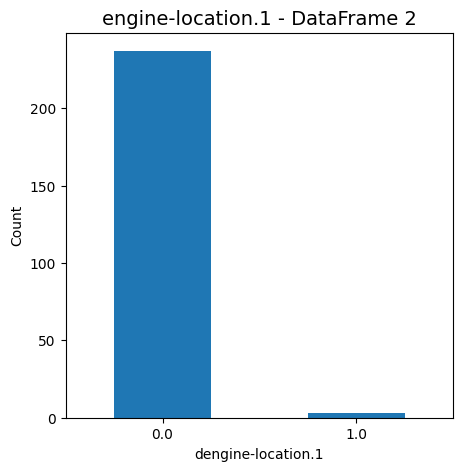

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["engine-location"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("engine-location - DataFrame 1", fontsize=14)
plt.xlabel("engine-location")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["engine-location.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("engine-location.1 - DataFrame 2", fontsize=14)
plt.xlabel("dengine-location.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["engine-location"].value_counts()

front    237
rear       3
Name: engine-location, dtype: int64

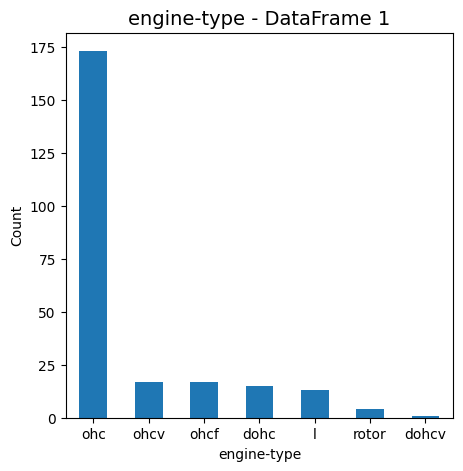

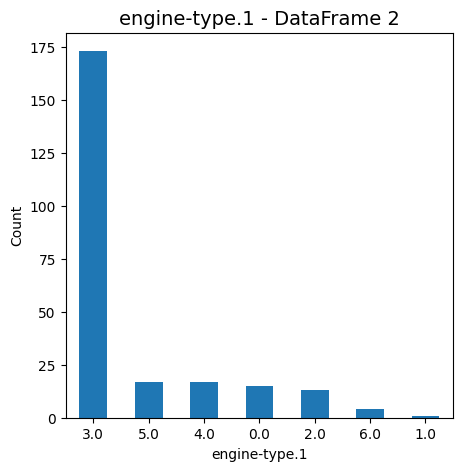

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["engine-type"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("engine-type - DataFrame 1", fontsize=14)
plt.xlabel("engine-type")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["engine-type.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("engine-type.1 - DataFrame 2", fontsize=14)
plt.xlabel("engine-type.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["engine-type"].value_counts()

ohc      173
ohcv      17
ohcf      17
dohc      15
l         13
rotor      4
dohcv      1
Name: engine-type, dtype: int64

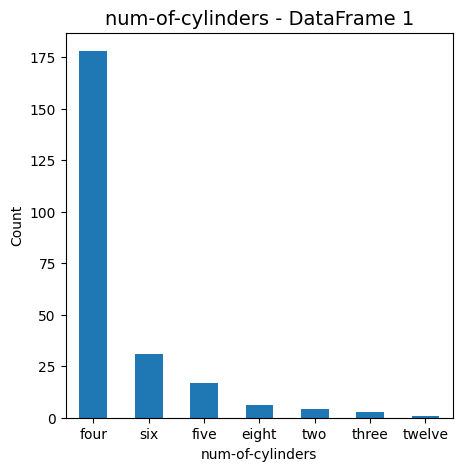

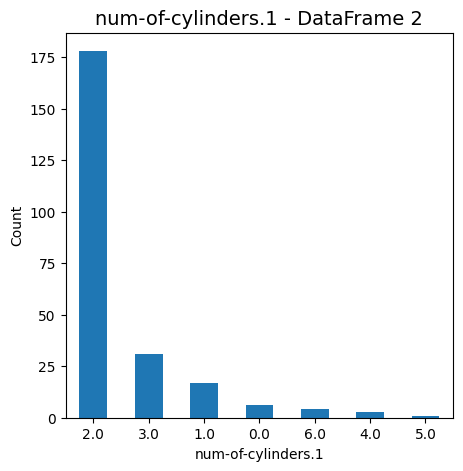

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["num-of-cylinders"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("num-of-cylinders - DataFrame 1", fontsize=14)
plt.xlabel("num-of-cylinders")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["num-of-cylinders.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("num-of-cylinders.1 - DataFrame 2", fontsize=14)
plt.xlabel("num-of-cylinders.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["num-of-cylinders"].value_counts()

four      178
six        31
five       17
eight       6
two         4
three       3
twelve      1
Name: num-of-cylinders, dtype: int64

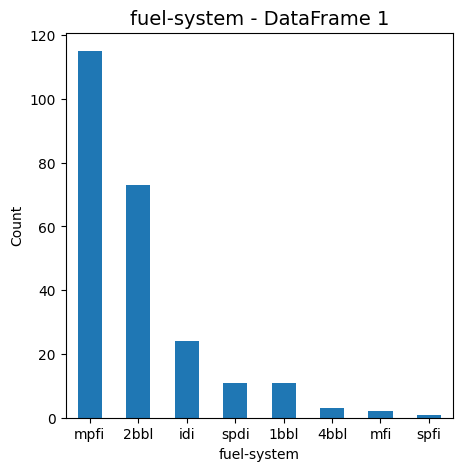

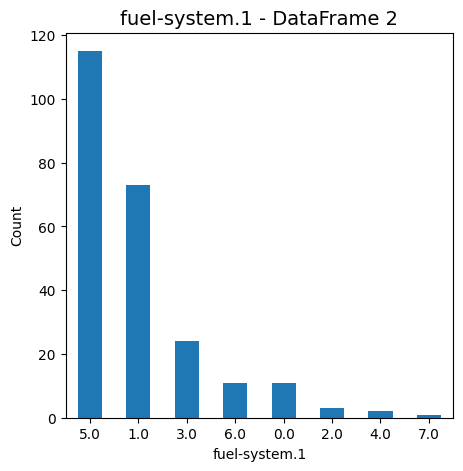

In [ ]:
# Gráfico para df1
plt.figure(figsize=(5, 5))
df["fuel-system"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("fuel-system - DataFrame 1", fontsize=14)
plt.xlabel("fuel-system")
plt.ylabel("Count")
plt.show()

# Gráfico para df2
plt.figure(figsize=(5, 5))
df2["fuel-system.1"].value_counts().plot(kind="bar", figsize=(5, 5), rot=0)
plt.title("fuel-system.1 - DataFrame 2", fontsize=14)
plt.xlabel("fuel-system.1")
plt.ylabel("Count")
plt.show()

In [ ]:
# Frecuencias para cada valor de la variable
df["fuel-system"].value_counts()

mpfi    115
2bbl     73
idi      24
spdi     11
1bbl     11
4bbl      3
mfi       2
spfi      1
Name: fuel-system, dtype: int64

### **3.5.2. Análisis Bivariado y Análisis de Outliers**

Para implementar un modelo de aprendizaje automático es de suma importancia analizar y verificar la existencia de valores outliers. Por lo tanto a continuación se realizaron gráficos boxplot relacionando el "price" con las diferentes variables categóricas y se detectaron existencia de valores atípicos como puede observarse en cada gráfico.

- Se observa que hay precios muy elevados

- Luego se verifica si después del preprocesamiento realizado los valores outliers fueron ajustados.

#### **Dataset original**

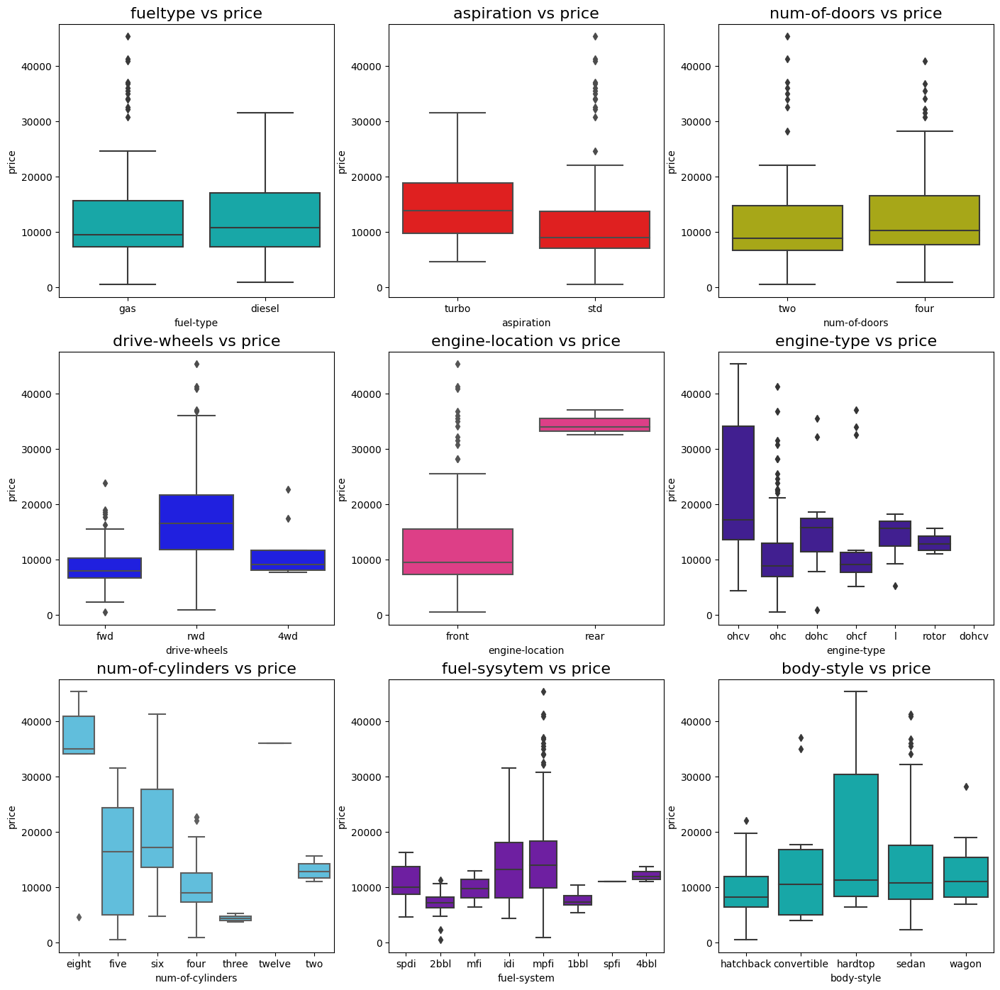

In [ ]:
fig=plt.figure(figsize=(17,17))

ax=fig.add_subplot(331)
sns.boxplot(data=df, x=df["fuel-type"], y=df["price"], hue=None ,color='c',ax=ax)
ax.set_title('fueltype vs price', fontsize=16)

ax=fig.add_subplot(332)
sns.boxplot(data=df, x=df["aspiration"], y=df["price"], hue=None ,color='r',ax=ax)
ax.set_title('aspiration vs price', fontsize=16)

ax=fig.add_subplot(333)
sns.boxplot(data=df, x=df["num-of-doors"], y=df["price"], hue=None ,color='y',ax=ax)
ax.set_title('num-of-doors vs price', fontsize=16)

ax=fig.add_subplot(334)
sns.boxplot(data=df, x=df["drive-wheels"], y=df["price"], hue=None ,color='b',ax=ax)
ax.set_title('drive-wheels vs price', fontsize=16)

ax=fig.add_subplot(335)
sns.boxplot(data=df, x=df["engine-location"], y=df["price"], hue=None ,color='#F72585',ax=ax)
ax.set_title('engine-location vs price', fontsize=16)


ax=fig.add_subplot(336)
sns.boxplot(data=df, x=df["engine-type"], y=df["price"], hue=None ,color='#3A0CA3',ax=ax)
ax.set_title('engine-type vs price', fontsize=16)

ax=fig.add_subplot(337)
sns.boxplot(data=df, x=df["num-of-cylinders"], y=df["price"], hue=None ,color='#4CC9F0',ax=ax)
ax.set_title('num-of-cylinders vs price', fontsize=16)


ax=fig.add_subplot(338)
sns.boxplot(data=df, x=df["fuel-system"], y=df["price"], hue=None ,color='#7209B7',ax=ax)
ax.set_title('fuel-sysytem vs price', fontsize=16)

ax=fig.add_subplot(339)
sns.boxplot(data=df, x=df["body-style"], y=df["price"], hue=None ,color='c',ax=ax)
ax.set_title('body-style vs price', fontsize=16)


plt.show()

#### **Dataset preprocesado**

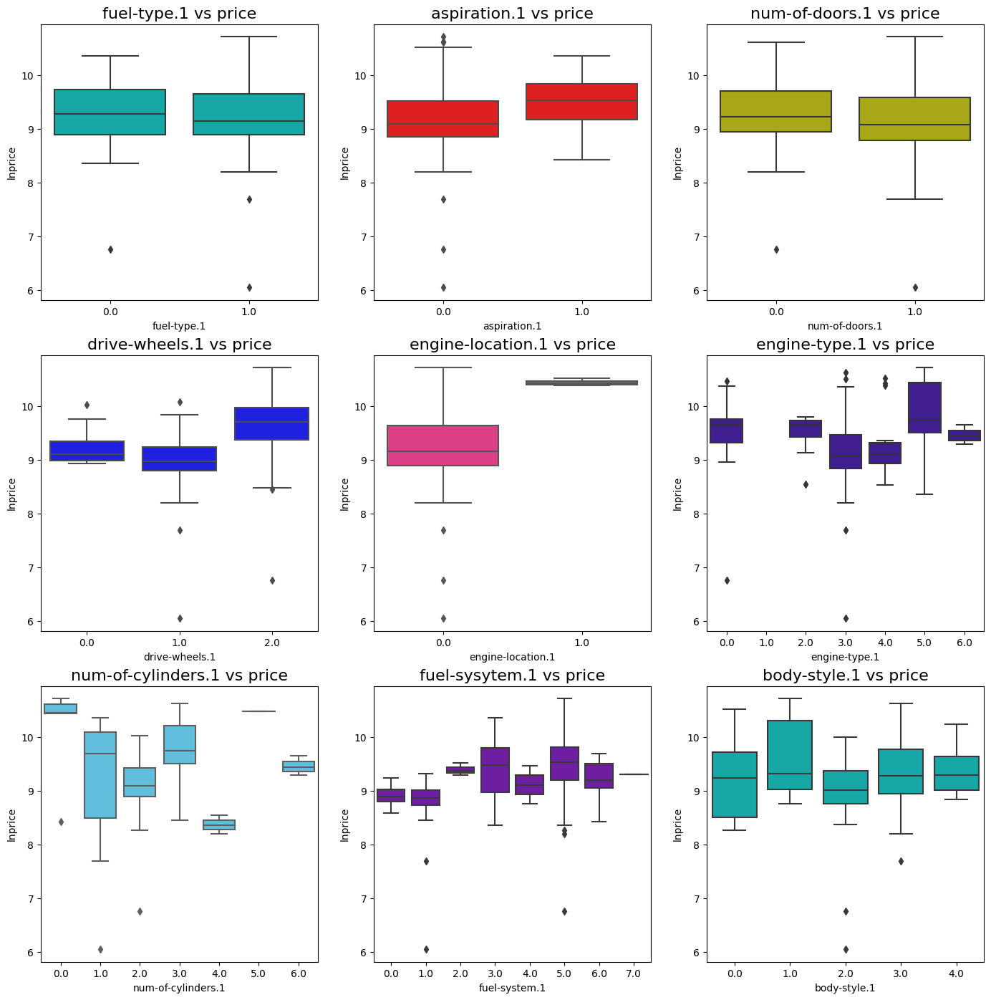

In [ ]:
fig=plt.figure(figsize=(17,17))

ax=fig.add_subplot(331)
sns.boxplot(data=df2, x=df2["fuel-type.1"], y=df2["lnprice"], hue=None ,color='c',ax=ax)
ax.set_title('fuel-type.1 vs price', fontsize=16)

ax=fig.add_subplot(332)
sns.boxplot(data=df2, x=df2["aspiration.1"], y=df2["lnprice"], hue=None ,color='r',ax=ax)
ax.set_title('aspiration.1 vs price', fontsize=16)

ax=fig.add_subplot(333)
sns.boxplot(data=df2, x=df2["num-of-doors.1"], y=df2["lnprice"], hue=None ,color='y',ax=ax)
ax.set_title('num-of-doors.1 vs price', fontsize=16)

ax=fig.add_subplot(334)
sns.boxplot(data=df2, x=df2["drive-wheels.1"], y=df2["lnprice"], hue=None ,color='b',ax=ax)
ax.set_title('drive-wheels.1 vs price', fontsize=16)

ax=fig.add_subplot(335)
sns.boxplot(data=df2, x=df2["engine-location.1"], y=df2["lnprice"], hue=None ,color='#F72585',ax=ax)
ax.set_title('engine-location.1 vs price', fontsize=16)


ax=fig.add_subplot(336)
sns.boxplot(data=df2, x=df2["engine-type.1"], y=df2["lnprice"], hue=None ,color='#3A0CA3',ax=ax)
ax.set_title('engine-type.1 vs price', fontsize=16)

ax=fig.add_subplot(337)
sns.boxplot(data=df2, x=df2["num-of-cylinders.1"], y=df2["lnprice"], hue=None ,color='#4CC9F0',ax=ax)
ax.set_title('num-of-cylinders.1 vs price', fontsize=16)


ax=fig.add_subplot(338)
sns.boxplot(data=df2, x=df2["fuel-system.1"], y=df2["lnprice"], hue=None ,color='#7209B7',ax=ax)
ax.set_title('fuel-sysytem.1 vs price', fontsize=16)

ax=fig.add_subplot(339)
sns.boxplot(data=df2, x=df2["body-style.1"], y=df2["lnprice"], hue=None ,color='c',ax=ax)
ax.set_title('body-style.1 vs price', fontsize=16)


plt.show()

Se puede observar que a pesar del preprocesamiento realizado aún existen valores atípicos cuando se relaciona el precio de los vehículos con el tipo de motor, estilo, numeros de cilindros y otras caracteristicas cualitativas. Por lo tanto esto deberá tenerse en cuenta al momento de seleccionar los predictores a utilizar como así también en la definición de las métricas de errores.

**Aclaración:** Una vez aplicadas las técnicas de Data Wrangling y EDA, los datos están preparados para:

**- INGENIERÍA DE PREDICTORES**

**- ENTRENAMIENTO Y SELECCIÓN DE MODELOS PREDICTIVOS**

Estos apartados no se presentarán en el presente trabajo.